<a href="https://colab.research.google.com/github/champsleague/ComputerVision/blob/main/UniMatch_demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<p align="center">
  <h1 align="center">Unifying Flow, Stereo and Depth Estimation</h1>
  <p align="center">
    <a href="https://haofeixu.github.io/">Haofei Xu</a>
    ·
    <a href="https://scholar.google.com/citations?user=9jH5v74AAAAJ">Jing Zhang</a>
    ·
    <a href="https://jianfei-cai.github.io/">Jianfei Cai</a>
    ·
    <a href="https://scholar.google.com/citations?user=VxAuxMwAAAAJ">Hamid Rezatofighi</a>
    ·
    <a href="https://www.yf.io/">Fisher Yu</a>
    ·
    <a href="https://scholar.google.com/citations?user=RwlJNLcAAAAJ">Dacheng Tao</a>
    ·
    <a href="http://www.cvlibs.net/">Andreas Geiger</a>
  </p>
  <h3 align="center"><a href="https://arxiv.org/abs/2211.05783">Paper</a> | <a href="https://haofeixu.github.io/unimatch/">Project Page</a> | <a href="https://github.com/autonomousvision/unimatch">GitHub</a> | <a href="https://huggingface.co/spaces/haofeixu/unimatch">Demo</a> </h3>
  <div align="center"></div>
</p>

<p align="center">
  <a href="">
    <img src="https://haofeixu.github.io/unimatch/resources/teaser.svg" alt="Logo" width="70%">
  </a>
</p>

<p align="center">
A unified model for three motion and 3D perception tasks.
</p>

Our code is able to run on both CPU and GPU, but a GPU is preferred for faster speed.

# Installation

In [1]:
# get the code 
!git clone https://github.com/autonomousvision/unimatch

Cloning into 'unimatch'...
remote: Enumerating objects: 192, done.
remote: Counting objects: 100% (57/57), done.
remote: Compressing objects: 100% (27/27), done.
remote: Total 192 (delta 49), reused 30 (delta 30), pack-reused 135
Receiving objects: 100% (192/192), 21.96 MiB | 19.96 MiB/s, done.
Resolving deltas: 100% (78/78), done.


In [2]:
%cd /content/unimatch

/content/unimatch


In [3]:
# dependencies
!bash pip_install.sh

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/torch_stable.html
ERROR: Could not find a version that satisfies the requirement torch==1.9.0+cu102 (from versions: 1.11.0, 1.11.0+cpu, 1.11.0+cu102, 1.11.0+cu113, 1.11.0+cu115, 1.11.0+rocm4.3.1, 1.11.0+rocm4.5.2, 1.12.0, 1.12.0+cpu, 1.12.0+cu102, 1.12.0+cu113, 1.12.0+cu116, 1.12.0+rocm5.0, 1.12.0+rocm5.1.1, 1.12.1, 1.12.1+cpu, 1.12.1+cu102, 1.12.1+cu113, 1.12.1+cu116, 1.12.1+rocm5.0, 1.12.1+rocm5.1.1, 1.13.0, 1.13.0+cpu, 1.13.0+cu116, 1.13.0+cu117, 1.13.0+cu117.with.pypi.cudnn, 1.13.0+rocm5.1.1, 1.13.0+rocm5.2, 1.13.1, 1.13.1+cpu, 1.13.1+cu116, 1.13.1+cu117, 1.13.1+cu117.with.pypi.cudnn, 1.13.1+rocm5.1.1, 1.13.1+rocm5.2, 2.0.0, 2.0.0+cpu, 2.0.0+cpu.cxx11.abi, 2.0.0+cu117, 2.0.0+cu117.with.pypi.cudnn, 2.0.0+cu118, 2.0.0+rocm5.3, 2.0.0+rocm5.4.2, 2.0.1, 2.0.1+cpu, 2.0.1+cpu.cxx11.abi, 2.0.1+cu117, 2.0.1+cu117.with.pypi.cudnn, 2.0.1+cu118, 

In [4]:
# check env
import torch

print('PyTorch version: %s' % torch.__version__)

if not torch.cuda.is_available():
  print('Running on CPU')
else:
  print('Runing on GPU %s' % torch.cuda.get_device_name())

PyTorch version: 2.0.1+cu118
Runing on GPU Tesla T4


# Download Model

In [5]:
# we assume the downloaded model weights are located under the pretrained directory.
%mkdir pretrained

In [6]:
# we provide a large number of model weights with different speed-accuracy trade-off trained on different datasets for downloading: 
# https://github.com/autonomousvision/unimatch/blob/master/MODEL_ZOO.md
# download example weights for flow, stereo and depth
!wget -P pretrained https://s3.eu-central-1.amazonaws.com/avg-projects/unimatch/pretrained/gmflow-scale2-regrefine6-mixdata-train320x576-4e7b215d.pth
!wget -P pretrained https://s3.eu-central-1.amazonaws.com/avg-projects/unimatch/pretrained/gmflow-scale2-regrefine6-kitti15-25b554d7.pth
!wget -P pretrained https://s3.eu-central-1.amazonaws.com/avg-projects/unimatch/pretrained/gmstereo-scale2-regrefine3-resumeflowthings-middleburyfthighres-a82bec03.pth
!wget -P pretrained https://s3.eu-central-1.amazonaws.com/avg-projects/unimatch/pretrained/gmdepth-scale1-regrefine1-resumeflowthings-scannet-90325722.pth

--2023-05-28 17:25:31--  https://s3.eu-central-1.amazonaws.com/avg-projects/unimatch/pretrained/gmflow-scale2-regrefine6-mixdata-train320x576-4e7b215d.pth
Resolving s3.eu-central-1.amazonaws.com (s3.eu-central-1.amazonaws.com)... 52.219.170.85
Connecting to s3.eu-central-1.amazonaws.com (s3.eu-central-1.amazonaws.com)|52.219.170.85|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 29500177 (28M) [binary/octet-stream]
Saving to: ‘pretrained/gmflow-scale2-regrefine6-mixdata-train320x576-4e7b215d.pth’

gmflow-scale2-regre 100%[===================>]  28.13M  12.3MB/s    in 2.3s    

2023-05-28 17:25:34 (12.3 MB/s) - ‘pretrained/gmflow-scale2-regrefine6-mixdata-train320x576-4e7b215d.pth’ saved [29500177/29500177]

--2023-05-28 17:25:34--  https://s3.eu-central-1.amazonaws.com/avg-projects/unimatch/pretrained/gmflow-scale2-regrefine6-kitti15-25b554d7.pth
Resolving s3.eu-central-1.amazonaws.com (s3.eu-central-1.amazonaws.com)... 52.219.170.85
Connecting to s3.eu-centra

In [7]:
# check downloading
%ls pretrained

gmdepth-scale1-regrefine1-resumeflowthings-scannet-90325722.pth
gmflow-scale2-regrefine6-kitti15-25b554d7.pth
gmflow-scale2-regrefine6-mixdata-train320x576-4e7b215d.pth
gmstereo-scale2-regrefine3-resumeflowthings-middleburyfthighres-a82bec03.pth


# Demo

In [8]:
# visualization utils
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image, display, HTML
from base64 import b64encode

plt.rcParams["figure.figsize"] = (30, 5)

def vis_img(img):
  plt.imshow(img)
  plt.axis("off")
  plt.show()

def vis_video(video_path):
  mp4 = open(video_path,'rb').read()
  data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
  return HTML("""
  <video width=600 controls>
        <source src="%s" type="video/mp4">
  </video>
  """ % data_url)

## Optical Flow

In [9]:
# inference on image dir
# script from: https://github.com/autonomousvision/unimatch/blob/master/scripts/gmflow_demo.sh
!python main_flow.py \
--inference_dir demo/flow-davis \
--resume pretrained/gmflow-scale2-regrefine6-mixdata-train320x576-4e7b215d.pth \
--output_path output/gmflow-scale2-regrefine6-davis \
--padding_factor 32 \
--upsample_factor 4 \
--num_scales 2 \
--attn_splits_list 2 8 \
--corr_radius_list -1 4 \
--prop_radius_list -1 1 \
--reg_refine \
--num_reg_refine 6

2023-05-28 17:25:45.846625: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
Load checkpoint: pretrained/gmflow-scale2-regrefine6-mixdata-train320x576-4e7b215d.pth
3 images found
/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Done!


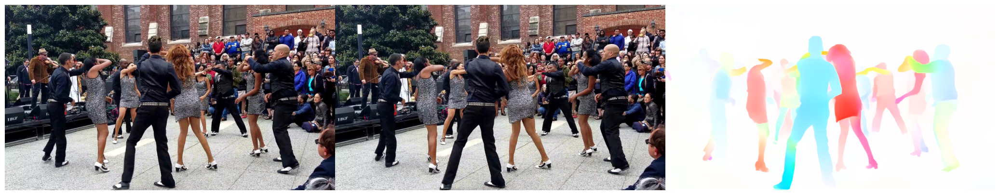

In [10]:
# visualize image and flow
img0_path = 'demo/flow-davis/00000.jpg'
img1_path = 'demo/flow-davis/00001.jpg'
flow_path = 'output/gmflow-scale2-regrefine6-davis/00000_flow.png'

img0, img1, flow = plt.imread(img0_path), plt.imread(img1_path), plt.imread(flow_path)
vis_img(np.concatenate([img0 / 255., img1 / 255., flow], axis=1))

In [11]:
# inference on video
# script from: https://github.com/autonomousvision/unimatch/blob/master/scripts/gmflow_demo.sh
!python main_flow.py \
--inference_video demo/kitti.mp4 \
--resume pretrained/gmflow-scale2-regrefine6-kitti15-25b554d7.pth \
--output_path output/kitti \
--padding_factor 32 \
--upsample_factor 4 \
--num_scales 2 \
--attn_splits_list 2 8 \
--corr_radius_list -1 4 \
--prop_radius_list -1 1 \
--reg_refine \
--num_reg_refine 6 \
--save_video \
--concat_flow_img

2023-05-28 17:25:56.547671: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
Load checkpoint: pretrained/gmflow-scale2-regrefine6-kitti15-25b554d7.pth
video size (hxw): 384x1248
fps: 10
50 images found
/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Done!


In [12]:
# visualize video
video_path = 'output/kitti/kitti_flow_img.mp4'
vis_video(video_path)

## Stereo Matching

In [13]:
# inference on a stereo pair
# script from: https://github.com/autonomousvision/unimatch/blob/master/scripts/gmstereo_demo.sh
!python main_stereo.py \
--inference_dir demo/stereo-middlebury \
--inference_size 1024 1536 \
--output_path output/gmstereo-scale2-regrefine3-middlebury \
--resume pretrained/gmstereo-scale2-regrefine3-resumeflowthings-middleburyfthighres-a82bec03.pth \
--padding_factor 32 \
--upsample_factor 4 \
--num_scales 2 \
--attn_type self_swin2d_cross_swin1d \
--attn_splits_list 2 8 \
--corr_radius_list -1 4 \
--prop_radius_list -1 1 \
--reg_refine \
--num_reg_refine 3

2023-05-28 17:26:55.350033: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
=> Load checkpoint: pretrained/gmstereo-scale2-regrefine3-resumeflowthings-middleburyfthighres-a82bec03.pth
1 test samples found
/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Done!


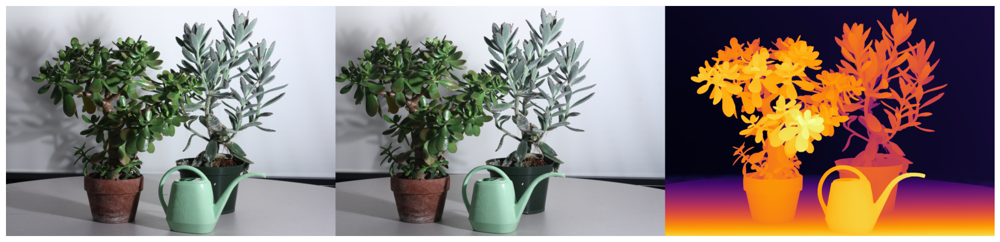

In [14]:
# visualize image and disparity
img0_path = 'demo/stereo-middlebury/im0.png'
img1_path = 'demo/stereo-middlebury/im1.png'
disp_path = 'output/gmstereo-scale2-regrefine3-middlebury/im0_disp.png'

img0, img1, disp = plt.imread(img0_path), plt.imread(img1_path), plt.imread(disp_path)
vis_img(np.concatenate([img0, img1, disp], axis=1))

## Depth Estimation

In [15]:
# inference on posed images
# script from: https://github.com/autonomousvision/unimatch/blob/master/scripts/gmdepth_demo.sh
!python main_depth.py \
--inference_dir demo/depth-scannet \
--output_path output/gmdepth-scale1-regrefine1-scannet \
--resume pretrained/gmdepth-scale1-regrefine1-resumeflowthings-scannet-90325722.pth \
--reg_refine \
--num_reg_refine 1


2023-05-28 17:27:11.895457: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
=> Load checkpoint: pretrained/gmdepth-scale1-regrefine1-resumeflowthings-scannet-90325722.pth
=> Predicting 0/4
/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Done!


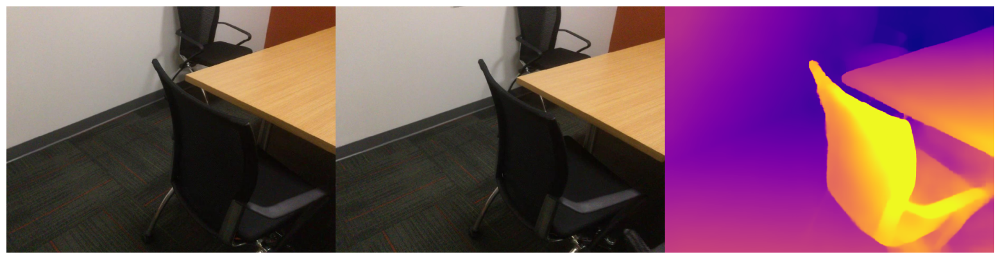

In [16]:
# visualize image and depth
img0_path = 'demo/depth-scannet/color/0048.png'
img1_path = 'demo/depth-scannet/color/0054.png'
depth_path = 'output/gmdepth-scale1-regrefine1-scannet/0048.png'

img0, img1, depth = plt.imread(img0_path), plt.imread(img1_path), plt.imread(depth_path)
vis_img(np.concatenate([img0, img1, depth], axis=1))

That's it!